# Exercises
**file name:** time_series_anomaly_detection.py or time_series_anomaly_detection.ipynb

## imports

In [1]:
import numpy as np
import pandas as pd
import math
from sklearn import metrics

from scipy.stats import entropy

import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import matplotlib.dates as mdates #to format dates on our plots
%matplotlib inline
import seaborn as sns

pd.set_option('display.max_columns', None)
pd.set_option("max_rows", 50_000)

## Acquire

In [2]:
colnames=['date', 'time_stamp', 'destination', 'user_id', 'cohort', 'ip_address']
df_orig = pd.read_csv('curriculum-access.txt',          
                 engine='python',
                 header=None,
                 index_col=False,
                 names=colnames,
                 sep=r'\s(?=(?:[^"]*"[^"]*")*[^"]*$)(?![^\[]*\])',     
                 na_values='"-"')

### setting new index as ds 

In [3]:
df_orig['ds'] = df_orig.date + ' ' + df_orig.time_stamp

In [4]:
df_orig.head(2)

,date,time_stamp,destination,user_id,cohort,ip_address,ds
0,2018-01-26,09:55:03,/,1,8.0,98.106.20.62,2018-01-26 09:55:03
1,2018-01-26,09:56:02,java-ii,1,8.0,98.106.20.62,2018-01-26 09:56:02


In [5]:
df_orig['ds'] = pd.to_datetime(df_orig['ds'])

In [6]:
df_orig = df_orig.sort_values('ds').set_index('ds')

In [7]:
df_orig.head(2)

,date,time_stamp,destination,user_id,cohort,ip_address
ds,,,,,,
2018-01-26 09:55:03,2018-01-26,09:55:03,/,1,8.0,98.106.20.62
2018-01-26 09:56:02,2018-01-26,09:56:02,java-ii,1,8.0,98.106.20.62


### removing redundant columns

In [8]:
df_orig = df_orig.drop(columns=(['date', 'time_stamp']))

## taking care of missing values

In [9]:
df_orig.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 543596 entries, 2018-01-26 09:55:03 to 2020-05-15 15:06:05
Data columns (total 4 columns):
destination    543595 non-null object
user_id        543596 non-null int64
cohort         515740 non-null float64
ip_address     543596 non-null object
dtypes: float64(1), int64(1), object(2)
memory usage: 20.7+ MB


In [10]:
df_orig.isna().sum()

#

destination        1
user_id            0
cohort         27856
ip_address         0
dtype: int64

In [11]:
mask = pd.isnull(df_orig['destination'])

df_orig[mask]

,destination,user_id,cohort,ip_address
ds,,,,
2020-04-08 09:25:18,NaN,586,55.0,73.178.241.52


In [12]:
df_orig[df_orig.user_id == 586]['destination']

ds
2020-02-03 15:42:12                                                    /
2020-02-04 04:37:19                                                    /
2020-02-04 04:59:08                                  appendix/vocabulary
2020-02-04 05:01:03                              6-regression/1-overview
2020-02-04 05:01:41                                                    /
2020-02-04 05:01:45             1-fundamentals/1.1-intro-to-data-science
2020-02-04 05:01:45                 1-fundamentals/AI-ML-DL-timeline.jpg
2020-02-04 05:01:45             1-fundamentals/modern-data-scientist.jpg
2020-02-04 05:22:41             1-fundamentals/1.1-intro-to-data-science
2020-02-04 05:22:41                 1-fundamentals/AI-ML-DL-timeline.jpg
2020-02-04 05:22:41             1-fundamentals/modern-data-scientist.jpg
2020-02-04 08:55:47             1-fundamentals/1.1-intro-to-data-science
2020-02-04 08:55:48             1-fundamentals/modern-data-scientist.jpg
2020-02-04 08:55:48                 1-fundamenta

In [13]:
df_orig = df_orig.dropna(subset=['destination'])

In [14]:
df_orig.isna().sum()

destination        0
user_id            0
cohort         27856
ip_address         0
dtype: int64

In [15]:
mask = pd.isnull(df_orig['cohort'])

df_orig[mask]

,destination,user_id,cohort,ip_address
ds,,,,
2018-01-26 16:46:16,/,48,NaN,98.106.20.62
2018-01-26 16:46:24,spring/extra-features/form-validation,48,NaN,98.106.20.62
2018-01-26 17:54:24,/,48,NaN,98.106.20.62
2018-01-26 18:32:03,/,48,NaN,98.106.20.62
2018-01-26 18:32:17,mysql/relationships/joins,48,NaN,98.106.20.62
2018-01-26 18:32:33,mysql/tables,48,NaN,98.106.20.62
2018-01-26 18:32:37,mysql/databases,48,NaN,98.106.20.62
2018-01-26 18:32:43,mysql/relationships,48,NaN,98.106.20.62
2018-01-26 18:32:47,mysql/relationships/joins,48,NaN,98.106.20.62


In [16]:
# screw it im backfillin the nan's in cohort
df_orig = df_orig.fillna(method='bfill')

df_orig.isna().sum()

destination    0
user_id        0
cohort         0
ip_address     0
dtype: int64

In [17]:
df = df_orig

In [18]:
# entropy computation function

def compute_entropy(series):
    counts = series.value_counts()
    if len(counts)==1:
        ent = 0
    else:
        value, counts = np.unique(series, return_counts=True)
        ent = entropy(counts, base=None)
    return ent

In [19]:
compute_entropy(df.destination)

5.452213066786651

In [20]:
compute_entropy(df.user_id)

5.992053007314734

In [21]:
compute_entropy(df.cohort)

3.048705159082899

In [22]:
compute_entropy(df.ip_address)

3.275074661417284

Discover users who are accessing our curriculum pages way beyond the end of their codeup time. What would the dataframe look like? Use time series method for detecting anomalies, like exponential moving average with %b.

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 543595 entries, 2018-01-26 09:55:03 to 2020-05-15 15:06:05
Data columns (total 4 columns):
destination    543595 non-null object
user_id        543595 non-null int64
cohort         543595 non-null float64
ip_address     543595 non-null object
dtypes: float64(1), int64(1), object(2)
memory usage: 40.7+ MB


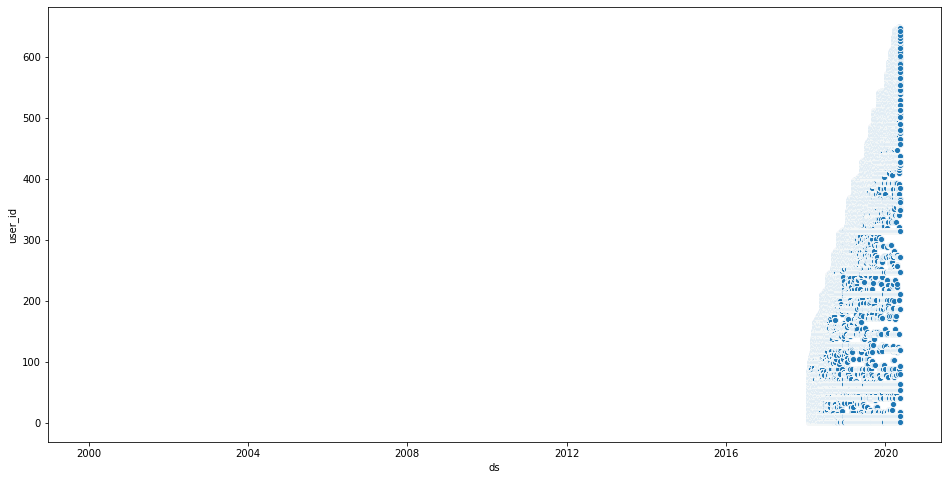

In [38]:
plt.figure(figsize=(16,8))
x = df.index
y = df.user_id

sns.scatterplot(x,y)


Bonus:

Can you label students who are viewing both the web dev and data science curriculum? Can you label students by the program they are in? Can you label users by student vs. staff? What are Zach, Maggie, David, and Ryan's ids?